<a href="https://colab.research.google.com/github/arguement/Currency-Recognition/blob/main/Currency_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Currency Recognition**

# **Overview of the Dataset**


This intended use of this dataset is to train a model that is able to confidently classify Jamaican dollar (JMD) \$100 and \$1,000 bank notes.

The dataset was created by mainly taken pictures of the two bank notes with smartphone cameras, in different lighting, positions and physical conditions.

There are **470** images in total in the dataset with **235** hundred dollar bill images and  **235** thousand dollar bill images. Between the two classes of Jamaican dollar bills, the images of over 50 bills were crowd sourced via Google Forms.

There are two subdirectories, one per class, with the directory name denoting the class name:

```
dataset/
  100/
  1000/
```


In [ ]:

from tensorflow.keras.preprocessing.image import array_to_img, img_to_array, load_img,save_img
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from pathlib import Path
from shutil import copyfile
import random
from tensorflow.keras import layers
from tensorflow.keras import Sequential,Model,Input
from tensorflow.keras.optimizers import RMSprop
import numpy as np

In [ ]:
import os
%load_ext autoreload

## Setup environment specific requirements and set paths. This is to accommodate
## running from Google Colab or from a local directory

if( os.path.isdir("/content") ):
  # Setup Specific to Google Colab Environment
 
  print("Running from Google Colab Environment")
  
  from google.colab import drive
  drive.mount('/content/drive')
      
  %cd "/content/drive/My Drive/COMP6125/Assignment-3"

  sourceDirectory = %pwd
  sourceDirectory = sourceDirectory + "/"
  
  
else:
  # Setup Specific to Local Jupyter Environment
  
  print('Running from Local Jupyter Environment')
 
  sourceDirectory = "./"


## Define common  imports here

from pprint import pprint
from datetime import datetime

processStartTime = datetime.today().strftime('%Y-%m-%d-%H:%M:%S')

Running from Google Colab Environment
Mounted at /content/drive
/content/drive/My Drive/COMP6125/Assignment-3


#Create Train, Test and Validation Dataset

In [ ]:
rootp = Path("/content/drive/MyDrive/COMP6125/Assignment-3/classification images")

In [ ]:
labels = []
for path in rootp.glob("*"):
  if path.is_dir():
    labels.append(path.name)

In [ ]:
if not Path(rootp,'train').exists():
  Path(rootp,'train').mkdir()
  for label in labels:
    Path(rootp,'train',label).mkdir()


if not Path(rootp,'test').exists():
  Path(rootp,'test').mkdir()
  for label in labels:
    Path(rootp,'test',label).mkdir()

if not Path(rootp,'validate').exists():
  Path(rootp,'validate').mkdir()
  for label in labels:
    Path(rootp,'validate',label).mkdir()

In [ ]:
random.seed(10)

In [ ]:
train_split = 0.8
test_split = 0.2
for label in labels:
  label_files = {i for i in Path(rootp,label).glob("*") if i.is_file()}
  label_files_len = len(label_files)

  for i in random.sample(label_files,int(test_split * label_files_len ) ):
    # Path(i).rename(Path(rootp,'test',label,i.name))
    copyfile(i, Path(rootp,'test',label,i.name))
    label_files.remove(i)

  # label_files = [i for i in Path(rootp,label).glob("*") if i.is_file()]
  for i in list(label_files):
    # Path(i).rename(Path(rootp,'train',label,i.name))
    copyfile(i, Path(rootp,'train',label,i.name))
    label_files.remove(i)



In [ ]:
validtion_split = 0.1
for label in labels:
  label_files = {i for i in Path(rootp,'train',label).glob("*") if i.is_file()}
  label_files_len = len(label_files)

  for i in random.sample(label_files,int(validtion_split * label_files_len ) ):
    # Path(i).rename(Path(rootp,'validate',label,i.name))
    copyfile(i, Path(rootp,'validate',label,i.name))
    label_files.remove(i)



#Exploration

## Sample of Train Data

###100s

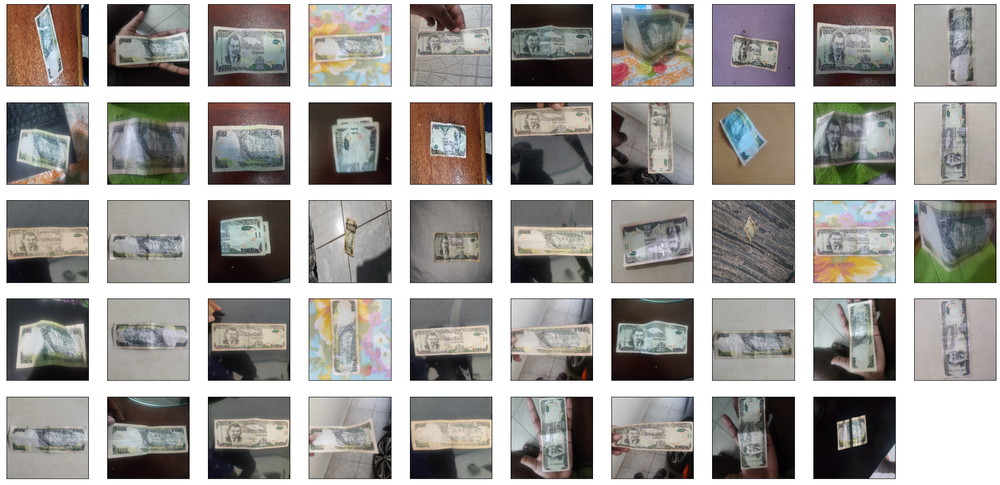

In [ ]:
i = 1
plt.figure(figsize=(30,30))
for file in [i for i in Path(rootp,'train','100').glob("*") if i.is_file()]:
  # plt.figure(i)
  img = load_img(file,target_size=(300, 300))  # this is a PIL image
  plt.subplot(10,10,i)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(img) 

  i+= 1
  if i >= 50:
    break



###1000s

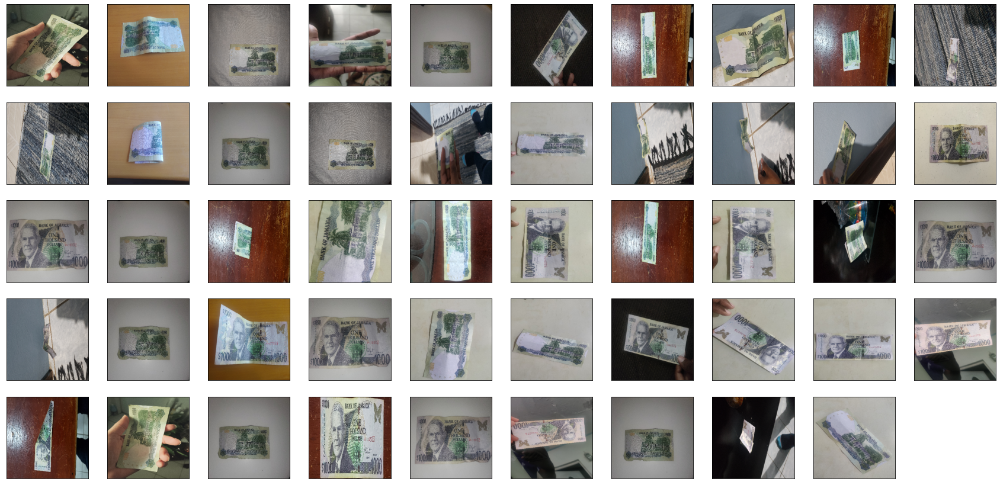

In [ ]:
i = 1
plt.figure(figsize=(30,30))
for file in [i for i in Path(rootp,'train','1000').glob("*") if i.is_file()]:
  # plt.figure(i)
  img = load_img(file,target_size=(300, 300))  # this is a PIL image
  plt.subplot(10,10,i)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(img) 

  i+= 1
  if i >= 50:
    break

In [ ]:
# train_datagen = ImageDataGenerator(
# zoom_range=0.4
#     )


# i = 0
# hlist = [i for i in Path(rootp,'train','100').glob("*") if i.is_file()]

# img = load_img(hlist[15],target_size=(500, 500))  # this is a PIL image
# x = img_to_array(img)  # Numpy array with shape (150, 150, 3)
# x = x.reshape((1,) + x.shape)  # Numpy array with shape (1, 150, 150, 3)


# # The .flow() command below generates batches of randomly transformed images
# # It will loop indefinitely, so we need to `break` the loop at some point!
# i = 0
# for batch in train_datagen.flow(x, batch_size=15):
#   plt.figure(i)
#   imgplot = plt.imshow(array_to_img(batch[0]))
#   i += 1
#   if i % 5 == 0:
#     break



##Sample of Test Data

###100s

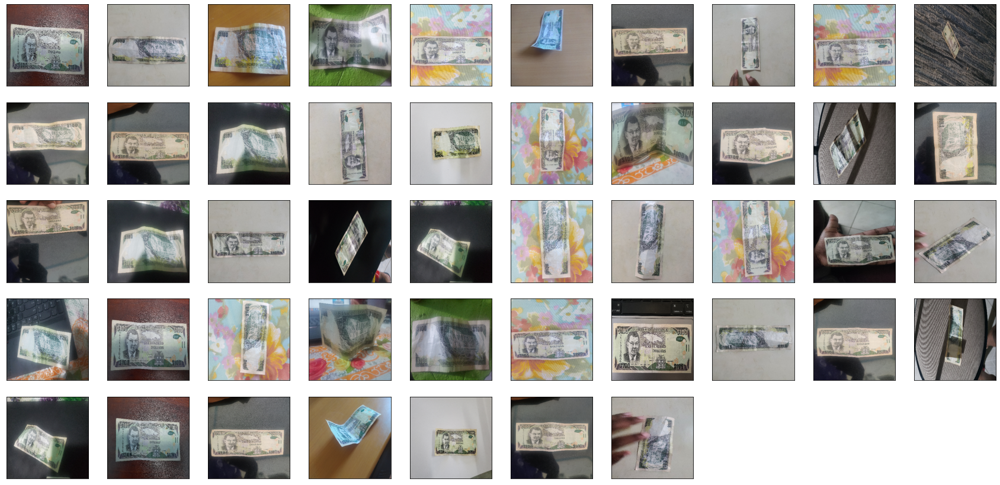

In [ ]:
i = 1
plt.figure(figsize=(30,30))
for file in [i for i in Path(rootp,'test',labels[1]).glob("*") if i.is_file()]:
  # plt.figure(i)
  img = load_img(file,target_size=(300, 300))  # this is a PIL image
  plt.subplot(10,10,i)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(img) 

  i+= 1
  if i >= 50:
    break

###1000s

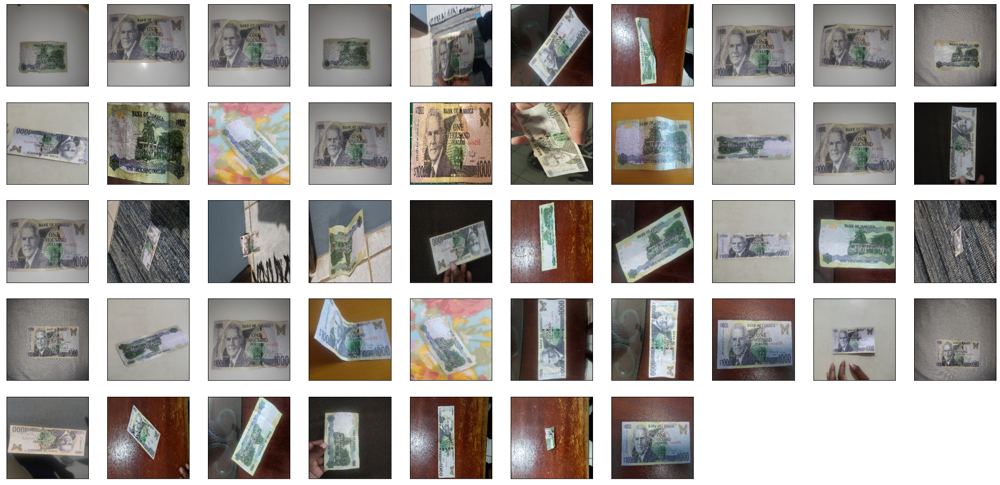

In [ ]:
i = 1
plt.figure(figsize=(30,30))
for file in [i for i in Path(rootp,'test',labels[0]).glob("*") if i.is_file()]:
  # plt.figure(i)
  img = load_img(file,target_size=(300, 300))  # this is a PIL image
  plt.subplot(10,10,i)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(img) 

  i+= 1
  if i >= 50:
    break

##Sample of Validation Data

###100s

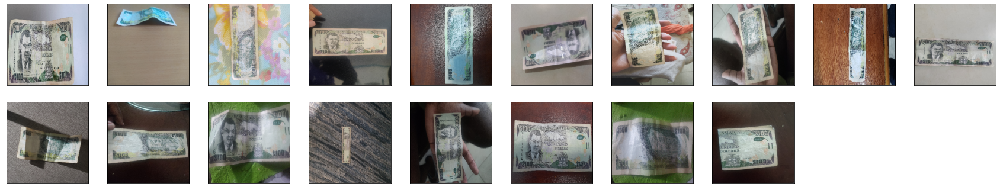

In [ ]:
i = 1
plt.figure(figsize=(30,30))
for file in [i for i in Path(rootp,'validate',labels[1]).glob("*") if i.is_file()]:
  # plt.figure(i)
  img = load_img(file,target_size=(300, 300))  # this is a PIL image
  plt.subplot(10,10,i)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(img) 

  i+= 1
  if i >= 50:
    break

###1000s

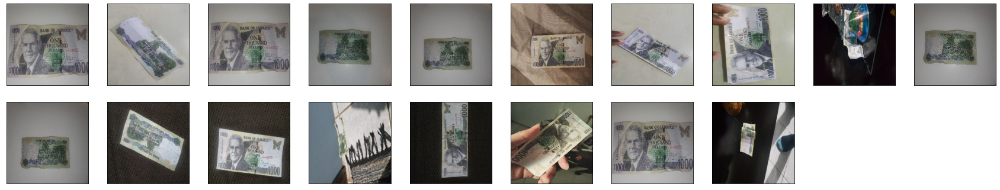

In [ ]:
i = 1
plt.figure(figsize=(30,30))
for file in [i for i in Path(rootp,'validate',labels[0]).glob("*") if i.is_file()]:
  # plt.figure(i)
  img = load_img(file,target_size=(300, 300))  # this is a PIL image
  plt.subplot(10,10,i)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(img) 

  i+= 1
  if i >= 50:
    break

#Augmentation

In [ ]:
# Adding rescale, rotation_range, width_shift_range, height_shift_range,
# shear_range, zoom_range, and horizontal flip to our ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1./255,
    # rotation_range=360,
    # width_shift_range=0.45,
    # height_shift_range=0.4,
    # shear_range=0.2,
    # zoom_range=0.4,
    # horizontal_flip=True,
    # vertical_flip=True
    )

# Note that the validation data should not be augmented!
val_datagen = ImageDataGenerator(rescale=1./255)

# Flow training images in batches of 32 using train_datagen generator
train_generator = train_datagen.flow_from_directory(
        Path(rootp,'train'),  # This is the source directory for training images
        target_size=(256, 256),  # All images will be resized to 150x150
        batch_size=1,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')


# Flow validation images in batches of 32 using val_datagen generator
validation_generator = val_datagen.flow_from_directory(
        Path(rootp,'validate'),
        target_size=(256, 256),
        batch_size=1,
        class_mode='binary')


Found 376 images belonging to 2 classes.
Found 36 images belonging to 2 classes.


In [ ]:
train_generator.class_indices

{'100': 0, '1000': 1}

##Sample Augmentations

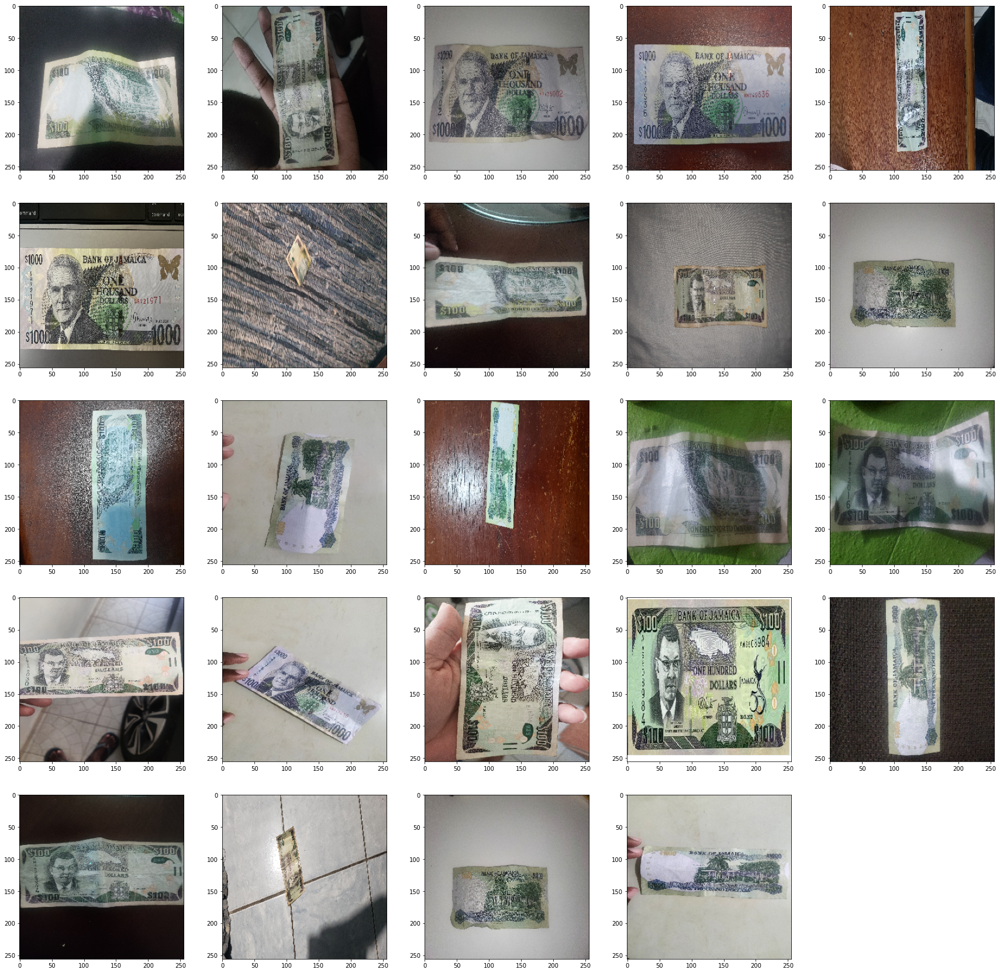

In [ ]:
i = 0
hlist = [i for i in Path(rootp,'train',labels[1]).glob("*") if i.is_file()]

img = load_img(hlist[15],target_size=(500, 500))  # this is a PIL image
x = img_to_array(img)  # Numpy array with shape (150, 150, 3)
x = x.reshape((1,) + x.shape)  # Numpy array with shape (1, 150, 150, 3)

plt.figure(figsize=(30,30))
# The .flow() command below generates batches of randomly transformed images
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 1
for batch in train_generator:
  # plt.figure(i)
  plt.subplot(5,5,i)
  # print( array_to_img(batch[0][1])) 
  imgplot = plt.imshow(array_to_img(batch[0][0]))
  i += 1
  if i % 25 == 0:
    break

#Model

In [ ]:
model = Sequential([
    layers.Input(shape=(256, 256, 3)),
    layers.Conv2D(16, 3, activation='relu'),
    layers.MaxPooling2D(2),
    layers.Conv2D(32, 3, activation='relu'),
    layers.MaxPooling2D(2),
    layers.Convolution2D(64, 3, activation='relu'),
    layers.MaxPooling2D(2),
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dense(128, activation='relu'),
    # layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

In [ ]:
# Configure and compile the model
# model = Model(img_input, output)
model.compile(loss='binary_crossentropy',
              optimizer="adam",
              metrics=['acc'])

In [ ]:
fmodel = model.fit_generator(
      train_generator,
      # steps_per_epoch=1,
      epochs=10,
      validation_data=validation_generator,
      # validation_steps=15,
      verbose=2)

model.save('model.h5')

<ipython-input-21-7c44cb4bb00d>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  fmodel = model.fit_generator(


Epoch 1/10
376/376 - 144s - loss: 0.7616 - acc: 0.5798 - val_loss: 0.6917 - val_acc: 0.5000 - 144s/epoch - 383ms/step
Epoch 2/10
376/376 - 142s - loss: 0.6888 - acc: 0.5186 - val_loss: 0.7418 - val_acc: 0.6111 - 142s/epoch - 377ms/step
Epoch 3/10
376/376 - 139s - loss: 0.7014 - acc: 0.6755 - val_loss: 0.6122 - val_acc: 0.7222 - 139s/epoch - 370ms/step
Epoch 4/10
376/376 - 139s - loss: 0.6017 - acc: 0.7128 - val_loss: 0.4668 - val_acc: 0.7222 - 139s/epoch - 369ms/step
Epoch 5/10
376/376 - 143s - loss: 0.6714 - acc: 0.7553 - val_loss: 0.3985 - val_acc: 0.8889 - 143s/epoch - 380ms/step
Epoch 6/10
376/376 - 139s - loss: 0.3952 - acc: 0.8324 - val_loss: 0.2322 - val_acc: 0.9167 - 139s/epoch - 369ms/step
Epoch 7/10
376/376 - 143s - loss: 0.2535 - acc: 0.9149 - val_loss: 0.1637 - val_acc: 0.9722 - 143s/epoch - 381ms/step
Epoch 8/10
376/376 - 144s - loss: 0.1202 - acc: 0.9574 - val_loss: 0.1514 - val_acc: 0.8889 - 144s/epoch - 383ms/step
Epoch 9/10
376/376 - 142s - loss: 0.1366 - acc: 0.9601 -

In [ ]:
# import tensorflow as tf
# tf.keras.backend.clear_session()

Text(0.5, 1.0, 'Training and validation loss')

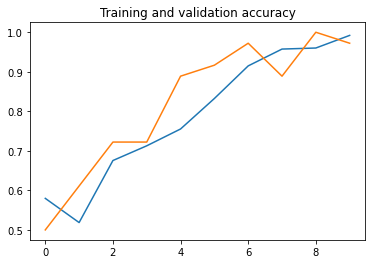

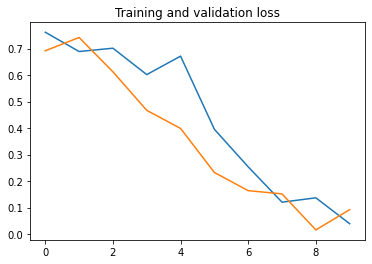

In [ ]:
history = fmodel 
# Retrieve a list of accuracy results on training and validation data
# sets for each training epoch
acc = history.history['acc']
val_acc = history.history['val_acc']

# Retrieve a list of list results on training and validation data
# sets for each training epoch
loss = history.history['loss']
val_loss = history.history['val_loss']

# Get number of epochs
epochs = range(len(acc))

# Plot training and validation accuracy per epoch
plt.plot(epochs, acc)
plt.plot(epochs, val_acc)
plt.title('Training and validation accuracy')

plt.figure()

# Plot training and validation loss per epoch
plt.plot(epochs, loss)
plt.plot(epochs, val_loss)
plt.title('Training and validation loss')

In [ ]:
# create a data generator
test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
test_it = test_datagen.flow_from_directory("/content/drive/MyDrive/COMP6125/Assignment-3/classification images/test",
                                           class_mode='binary', 
                                          #  batch_size=64,
                                           target_size=(256,256))

Found 94 images belonging to 2 classes.


In [ ]:
# evaluate model
test_loss, test_acc  = model.evaluate_generator(test_it, verbose=2)
print('\nTest accuracy:', test_acc)

<ipython-input-26-3381293924ca>:2: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc  = model.evaluate_generator(test_it, verbose=2)


3/3 - 25s - loss: 1.6654 - acc: 0.7234 - 25s/epoch - 8s/step

Test accuracy: 0.7234042286872864


In [ ]:
a = next(test_it)
# b = next(test_it)
# b[0][0].shape
# np.array([a[0][0]]).shape
model.predict(np.array([a[0][1]]))

1/1 [==============================] - 0s 260ms/step


array([[1.9390513e-06]], dtype=float32)

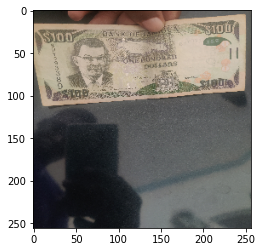

In [ ]:
plt.imshow(a[0][1])

In [ ]:
a[1][1]

0.0

##Transfer Learning

In [ ]:
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O /tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5

--2023-01-13 05:00:41--  https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 64.233.191.128, 173.194.192.128, 209.85.146.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|64.233.191.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/x-hdf]
Saving to: ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

/tmp/inception_v3_w 100%[===================>]  83.84M   124MB/s    in 0.7s    

2023-01-13 05:00:42 (124 MB/s) - ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]



In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3

local_weights_file = '/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'
pre_trained_model = InceptionV3(weights = 'imagenet',include_top = False,input_shape=(256,256,3))
# pre_trained_model.load_weights(local_weights_file)

# Freeze the layers in the model
for layer in pre_trained_model.layers:
    layer.trainable = False

last_layer = pre_trained_model.get_layer('mixed7')
last_output = last_layer.output



87910968/87910968 [==============================] - 1s 0us/step


In [ ]:
# Flatten the output layer to 1 dimension

x = layers.Flatten()(last_output)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = layers.Dense(256, activation='relu')(x)
# Add a dropout rate of 0.2
x = layers.Dense(128, activation='relu')(x)
# x = layers.Dropout(0.2)(x)
# Add a final sigmoid layer for classification
x = layers.Dense(1, activation='sigmoid')(x)

# Configure and compile the model
model = Model( pre_trained_model.input, x)
model.compile(loss='binary_crossentropy',
              optimizer="adam",
              metrics=['acc'])

In [ ]:
tmodel = model.fit(
      train_generator,
      # steps_per_epoch=1,
      epochs=5,
      validation_data=validation_generator,
      # validation_steps=1,
      verbose=2)

# model.save('model.h5')

Epoch 1/5
376/376 - 252s - loss: 0.8035 - acc: 0.7713 - val_loss: 0.1633 - val_acc: 0.8889 - 252s/epoch - 670ms/step
Epoch 2/5
376/376 - 235s - loss: 0.2313 - acc: 0.9388 - val_loss: 0.0012 - val_acc: 1.0000 - 235s/epoch - 626ms/step
Epoch 3/5
376/376 - 241s - loss: 0.1212 - acc: 0.9761 - val_loss: 12.4922 - val_acc: 0.5556 - 241s/epoch - 640ms/step
Epoch 4/5
376/376 - 233s - loss: 0.1291 - acc: 0.9707 - val_loss: 0.0049 - val_acc: 1.0000 - 233s/epoch - 620ms/step
Epoch 5/5
376/376 - 239s - loss: 0.0028 - acc: 1.0000 - val_loss: 1.0636e-04 - val_acc: 1.0000 - 239s/epoch - 636ms/step


In [ ]:
# evaluate model
test_loss, test_acc  = model.evaluate_generator(test_it, verbose=2)
print('\nTest accuracy:', test_acc)

<ipython-input-46-3381293924ca>:2: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc  = model.evaluate_generator(test_it, verbose=2)


3/3 - 36s - loss: 0.3471 - acc: 0.9468 - 36s/epoch - 12s/step

Test accuracy: 0.9468085169792175


In [ ]:
model.save("transfer_learning_model.h5")

Text(0.5, 1.0, 'Training and validation loss')

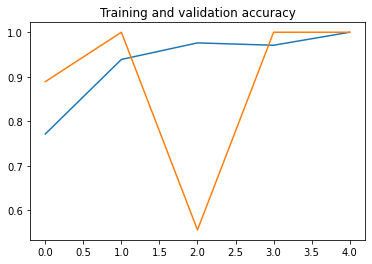

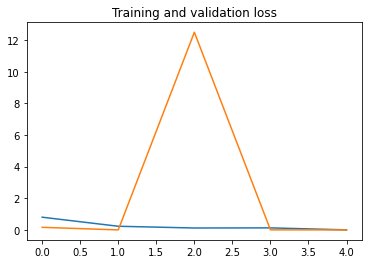

In [ ]:
history = tmodel
# Retrieve a list of accuracy results on training and validation data
# sets for each training epoch
acc = history.history['acc']
val_acc = history.history['val_acc']

# Retrieve a list of list results on training and validation data
# sets for each training epoch
loss = history.history['loss']
val_loss = history.history['val_loss']

# Get number of epochs
epochs = range(len(acc))

# Plot training and validation accuracy per epoch
plt.plot(epochs, acc)
plt.plot(epochs, val_acc)
plt.title('Training and validation accuracy')

plt.figure()

# Plot training and validation loss per epoch
plt.plot(epochs, loss)
plt.plot(epochs, val_loss)
plt.title('Training and validation loss')

In [ ]:
!apt-get install texlive texlive-xetex texlive-latex-extra pandoc
!pip install pypandoc

Reading package lists... Done
Building dependency tree       
Reading state information... Done
pandoc is already the newest version (1.19.2.4~dfsg-1build4).
pandoc set to manually installed.
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  fonts-droid-fallback fonts-lato fonts-lmodern fonts-noto-mono fonts-texgyre
  javascript-common libcupsfilters1 libcupsimage2 libgs9 libgs9-common
  libijs-0.35 libjbig2dec0 libjs-jquery libkpathsea6 libpotrace0 libptexenc1
  libruby2.5 libsynctex1 libtexlua52 libtexluajit2 libzzip-0-13 lmodern
  poppler-data preview-latex-style rake ruby ruby-did-you-mean ruby-minitest
  ruby-net-telnet ruby-power-assert ruby-test-unit ruby2.5
  rubygems-integration t1utils tex-common tex-gyre texlive-base
  texlive-binaries texlive-fonts-recommended texlive-latex-base
  texlive-latex-recommended texlive-pictures texlive-plain

In [ ]:
!cp "/content/drive/My Drive/Colab Notebooks/Assignment Three.ipynb" ./

!jupyter nbconvert --to PDF "Assignment Three.ipynb"

[NbConvertApp] Converting notebook Assignment Three.ipynb to PDF
[NbConvertApp] Support files will be in Assignment Three_files/
[NbConvertApp] Making directory ./Assignment Three_files
[NbConvertApp] Making directory ./Assignment Three_files
[NbConvertApp] Making directory ./Assignment Three_files
[NbConvertApp] Writing 73867 bytes to ./notebook.tex
[NbConvertApp] Building PDF
[NbConvertApp] Running xelatex 3 times: ['xelatex', './notebook.tex', '-quiet']
[NbConvertApp] Running bibtex 1 time: ['bibtex', './notebook']
[NbConvertApp] WARNING | bibtex had problems, most likely because there were no citations
[NbConvertApp] PDF successfully created
[NbConvertApp] Writing 1279174 bytes to Assignment Three.pdf


In [ ]:
unfreeze = False

# Unfreeze all models after "mixed6"
for layer in pre_trained_model.layers:
  if unfreeze:
    layer.trainable = True
  if layer.name == 'mixed6':
    unfreeze = True


In [ ]:
model.compile(loss='binary_crossentropy',
              optimizer="adam",
              metrics=['acc'])

In [ ]:
tmodel = model.fit(
      train_generator,
      # steps_per_epoch=1,
      epochs=9,
      validation_data=validation_generator,
      # validation_steps=1,
      verbose=2)

Epoch 1/9
376/376 - 257s - loss: 3.1234e-05 - acc: 1.0000 - val_loss: 5.0127e-08 - val_acc: 1.0000 - 257s/epoch - 684ms/step
Epoch 2/9
376/376 - 233s - loss: 1.3332e-10 - acc: 1.0000 - val_loss: 7.4566e-08 - val_acc: 1.0000 - 233s/epoch - 619ms/step
Epoch 3/9
376/376 - 239s - loss: 1.2020e-10 - acc: 1.0000 - val_loss: 6.0898e-08 - val_acc: 1.0000 - 239s/epoch - 634ms/step
Epoch 4/9
376/376 - 231s - loss: 1.1000e-10 - acc: 1.0000 - val_loss: 6.5883e-08 - val_acc: 1.0000 - 231s/epoch - 614ms/step
Epoch 5/9
376/376 - 237s - loss: 1.0092e-10 - acc: 1.0000 - val_loss: 3.4070e-08 - val_acc: 1.0000 - 237s/epoch - 630ms/step
Epoch 6/9
376/376 - 231s - loss: 9.3437e-11 - acc: 1.0000 - val_loss: 3.7980e-08 - val_acc: 1.0000 - 231s/epoch - 616ms/step
Epoch 7/9
376/376 - 232s - loss: 8.8600e-11 - acc: 1.0000 - val_loss: 6.2138e-08 - val_acc: 1.0000 - 232s/epoch - 617ms/step
Epoch 8/9
376/376 - 240s - loss: 8.4361e-11 - acc: 1.0000 - val_loss: 5.6254e-08 - val_acc: 1.0000 - 240s/epoch - 639ms/step


Text(0.5, 1.0, 'Training and validation loss')

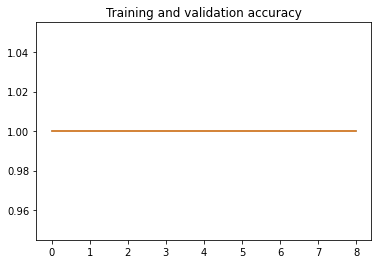

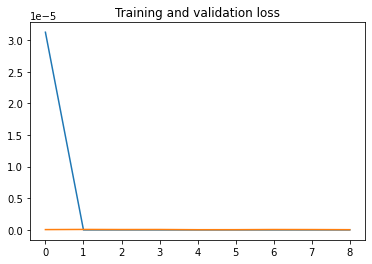

In [ ]:
history = tmodel
# Retrieve a list of accuracy results on training and validation data
# sets for each training epoch
acc = history.history['acc']
val_acc = history.history['val_acc']

# Retrieve a list of list results on training and validation data
# sets for each training epoch
loss = history.history['loss']
val_loss = history.history['val_loss']

# Get number of epochs
epochs = range(len(acc))

# Plot training and validation accuracy per epoch
plt.plot(epochs, acc)
plt.plot(epochs, val_acc)
plt.title('Training and validation accuracy')

plt.figure()

# Plot training and validation loss per epoch
plt.plot(epochs, loss)
plt.plot(epochs, val_loss)
plt.title('Training and validation loss')

In [ ]:
# evaluate model
test_loss, test_acc  = model.evaluate_generator(test_it, verbose=2)
print('\nTest accuracy:', test_acc)

<ipython-input-56-3381293924ca>:2: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc  = model.evaluate_generator(test_it, verbose=2)


3/3 - 38s - loss: 1.7454 - acc: 0.9043 - 38s/epoch - 13s/step

Test accuracy: 0.9042553305625916
